Loading normalization statistics...


[20:02:47 - checkpoint - INFO] Loaded model state dictionary /work/m24046/m24046mrcr/testAter/Configx8ShortPushFront/MeshGraphNet.0.900.mdlus to device cuda
[20:02:47 - checkpoint - INFO] Loaded checkpoint file /work/m24046/m24046mrcr/testAter/Configx8ShortPushFront/checkpoint.0.900.pt to device cuda


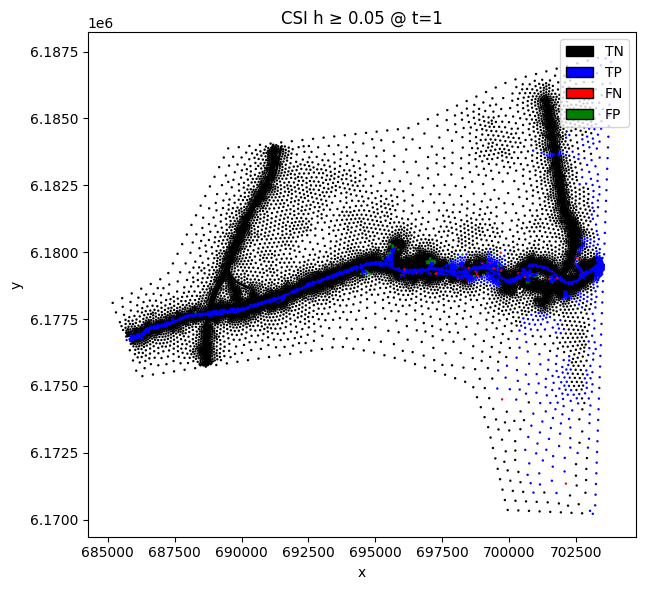

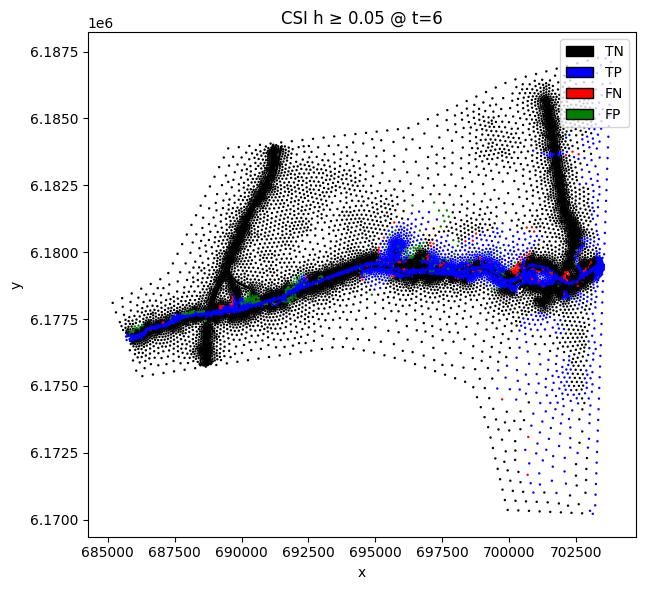

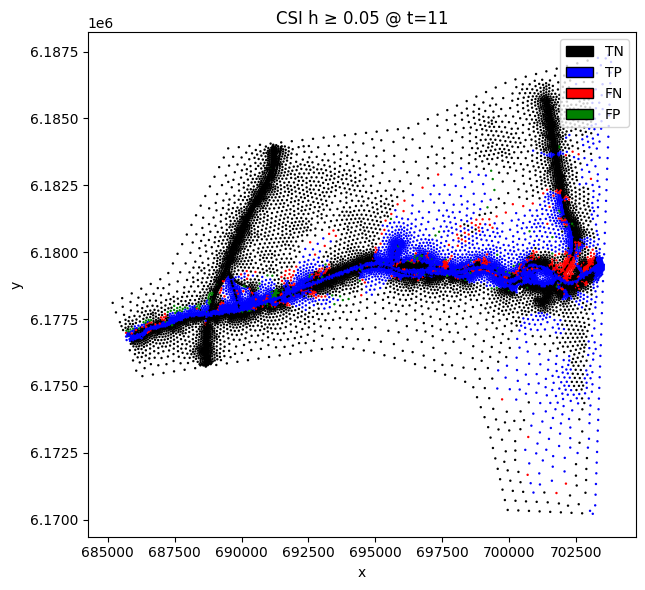

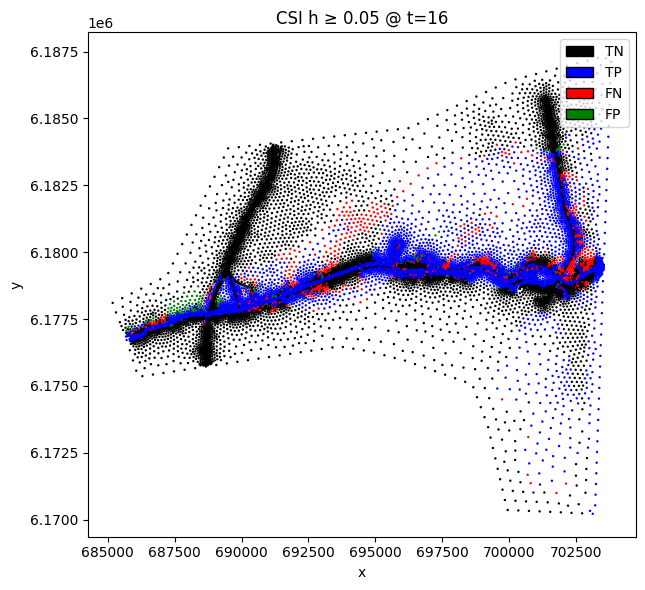

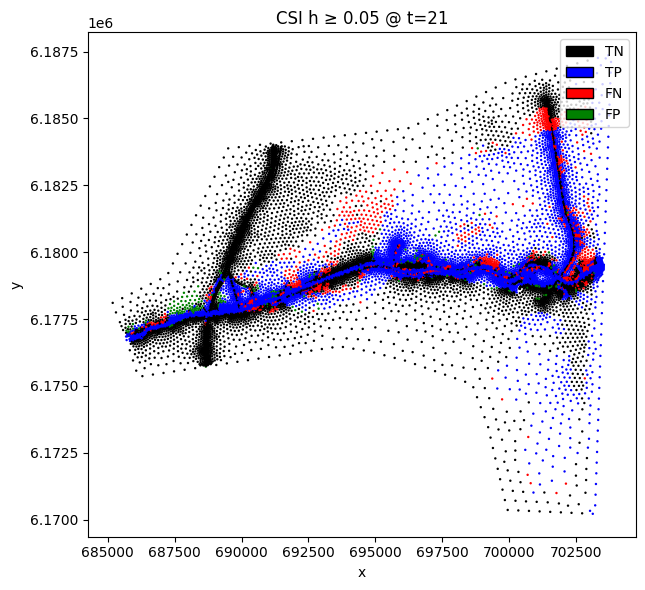

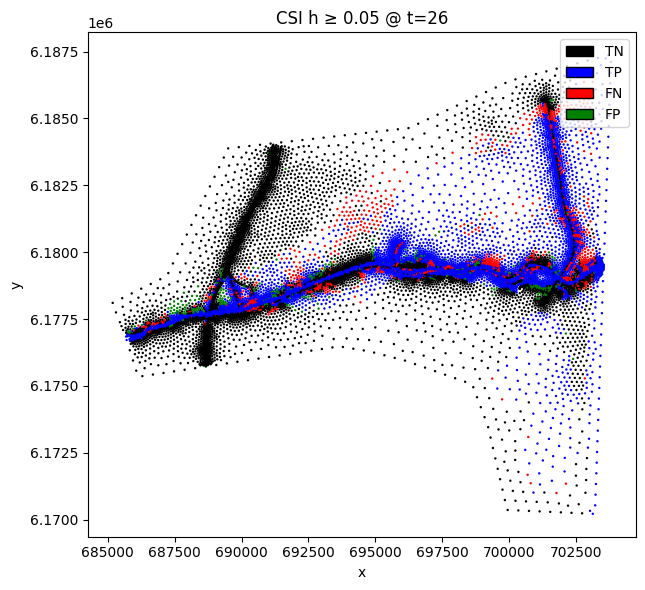

Group_1_peak_2600_Group_1_peak_2600_0_0-80_interpolated.pkl : CSI(h) moyen = 0.806


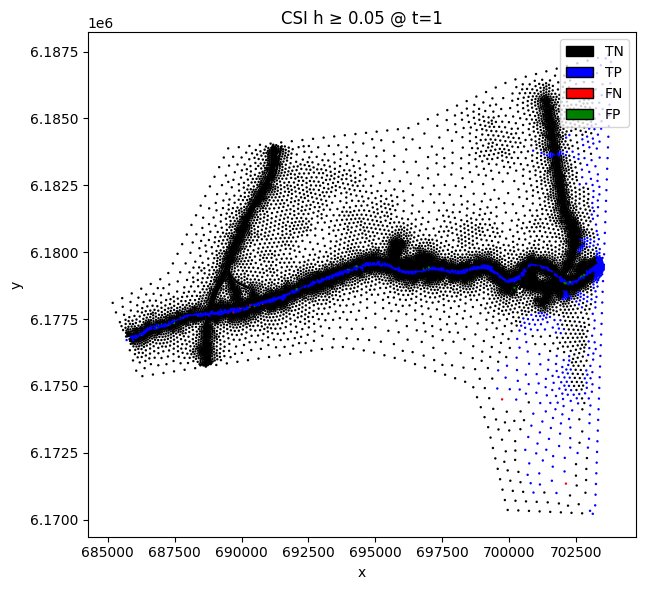

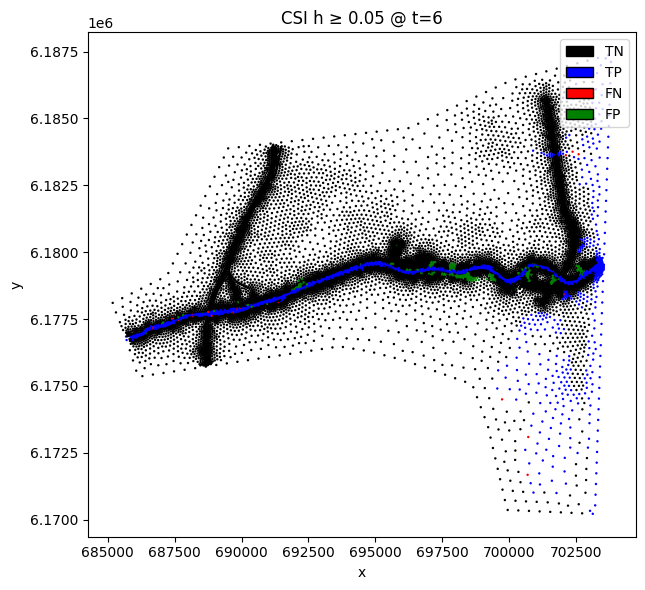

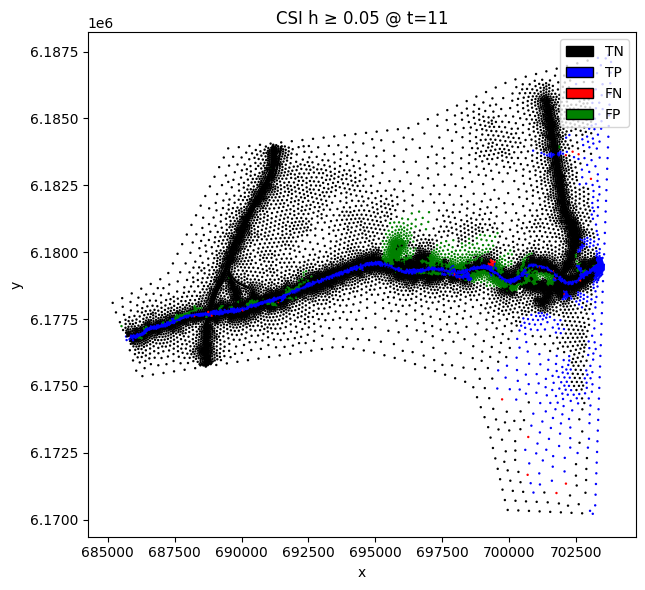

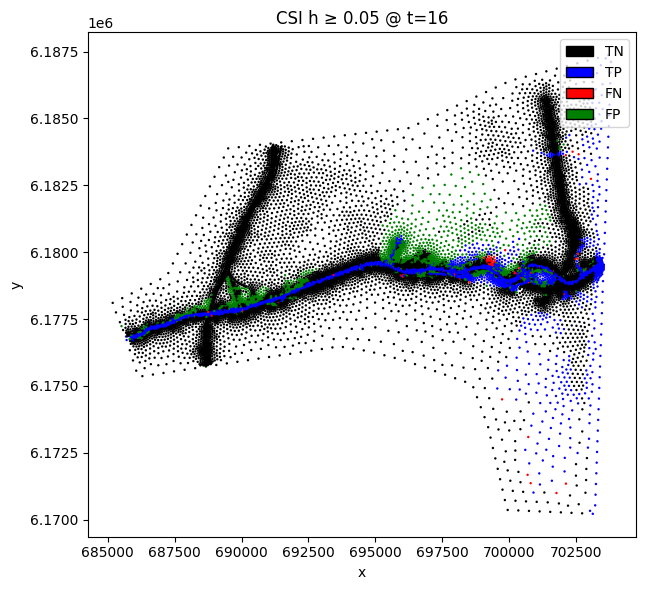

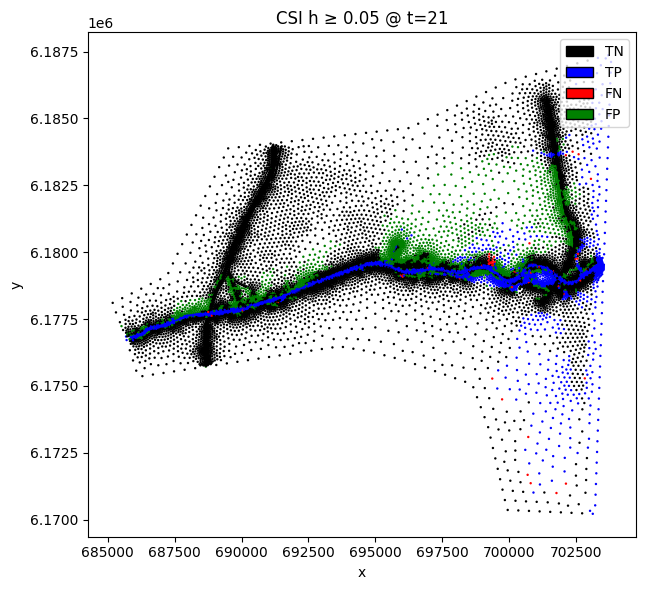

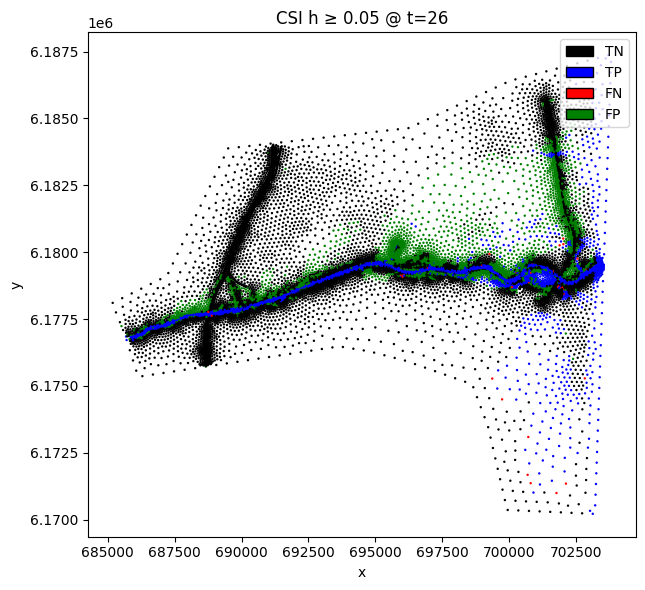

Group_2_peak_1000_Group_2_peak_1000_0_0-80_interpolated.pkl : CSI(h) moyen = 0.604


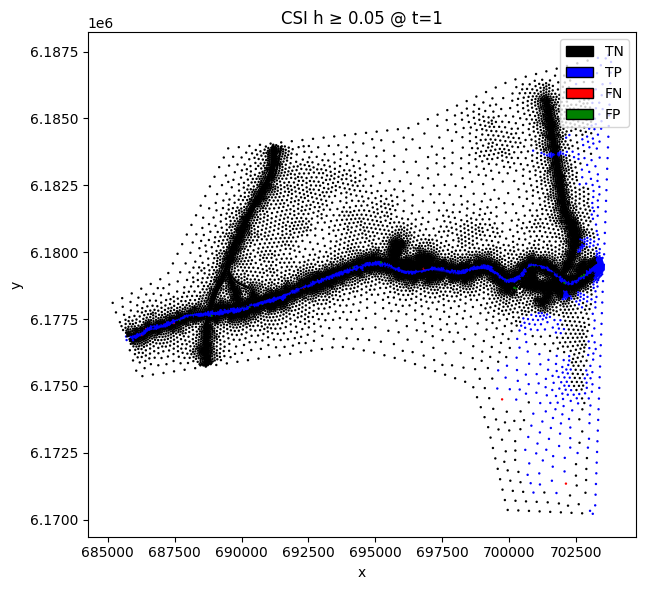

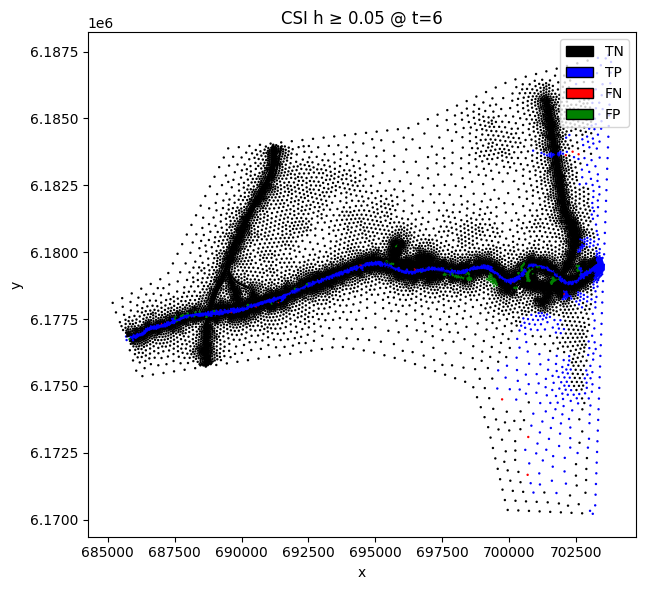

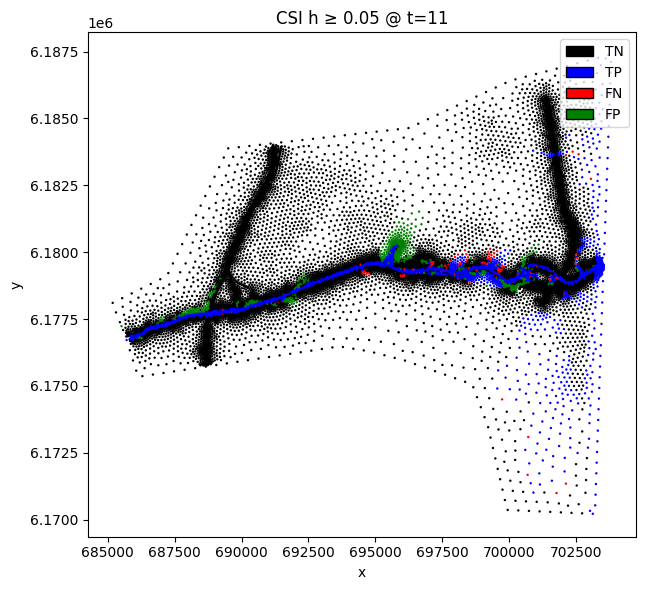

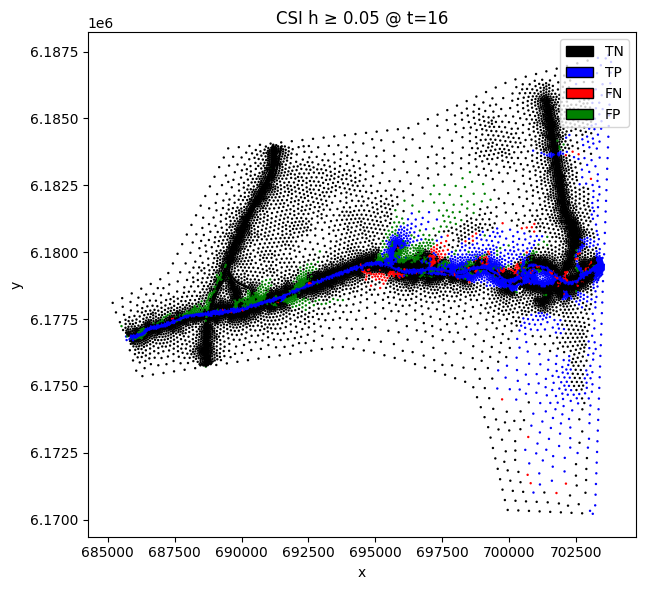

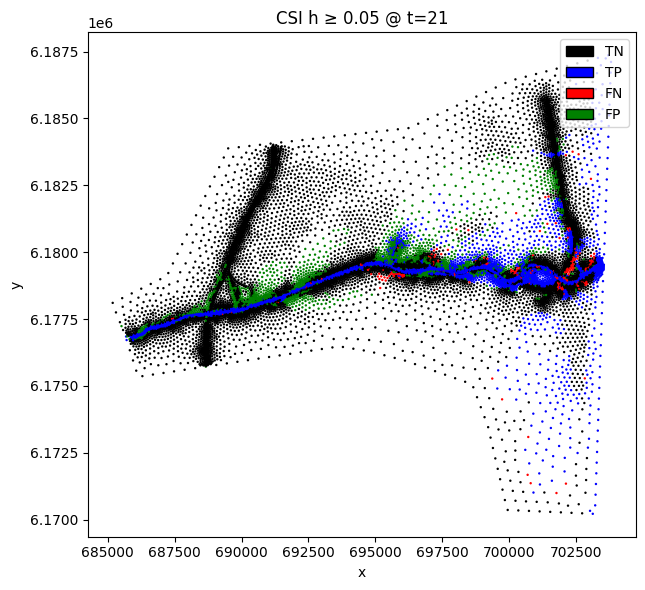

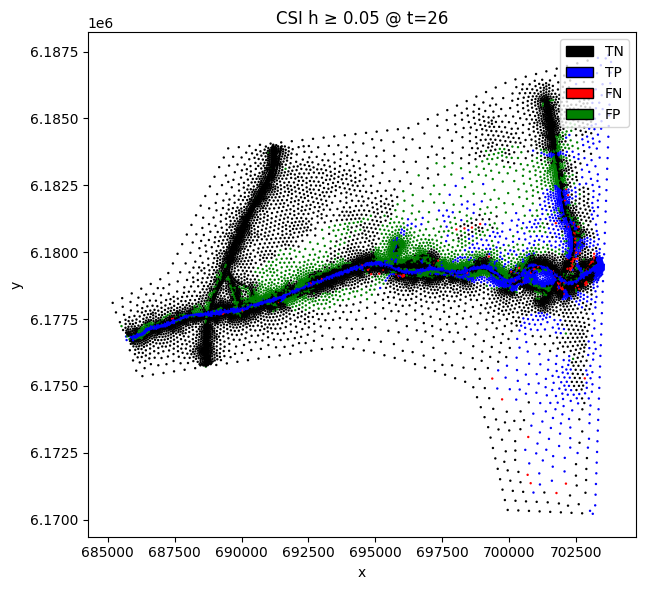

Group_2_peak_1200_Group_2_peak_1200_0_0-80_interpolated.pkl : CSI(h) moyen = 0.686


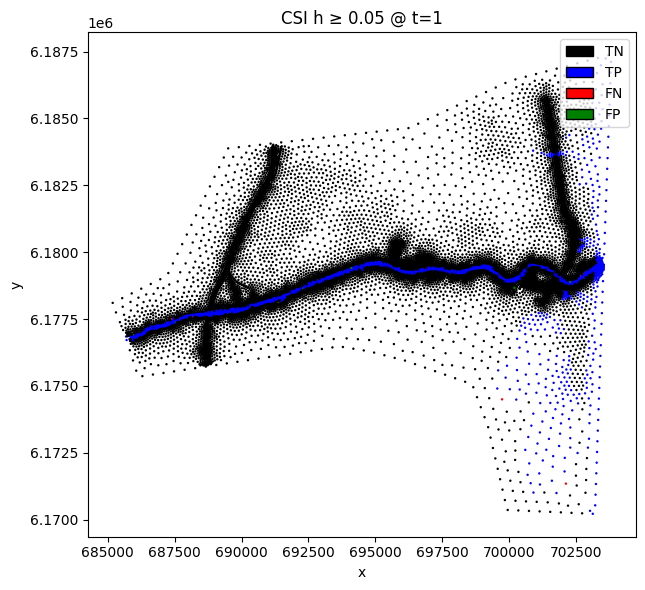

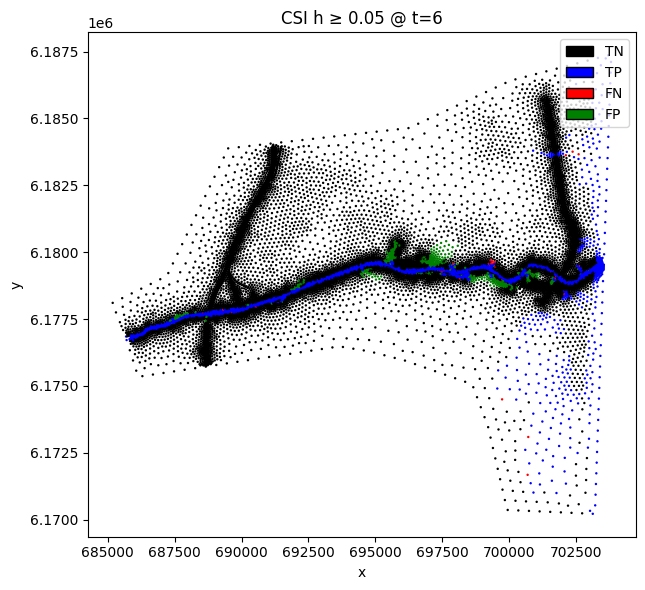

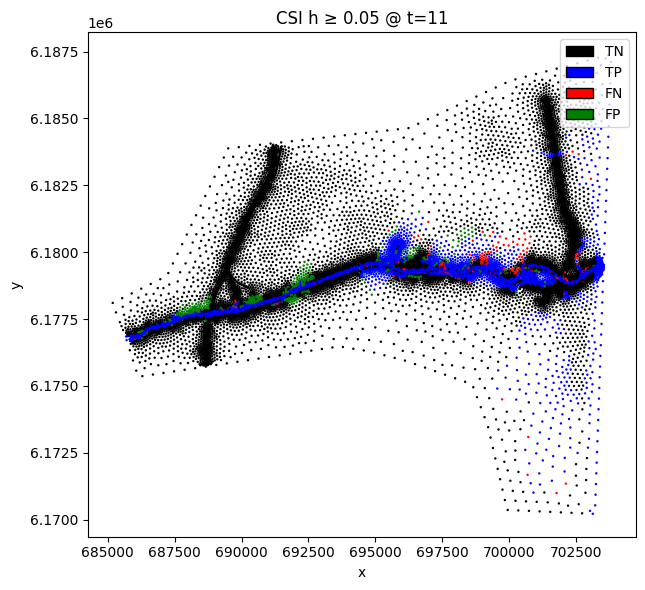

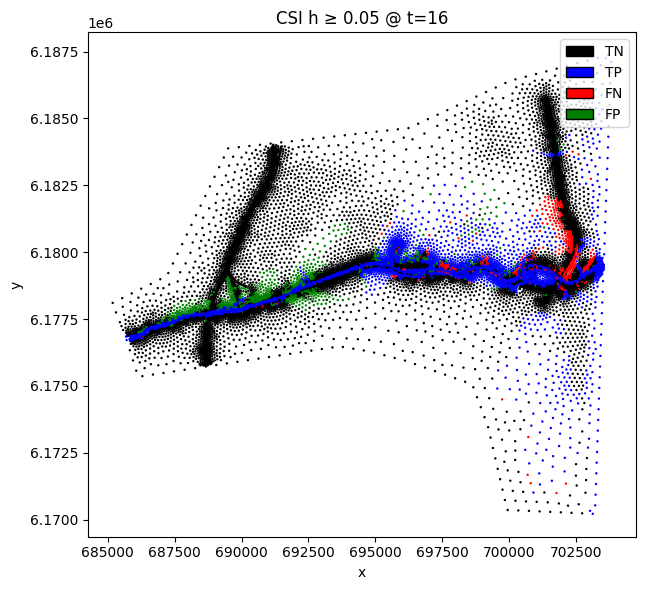

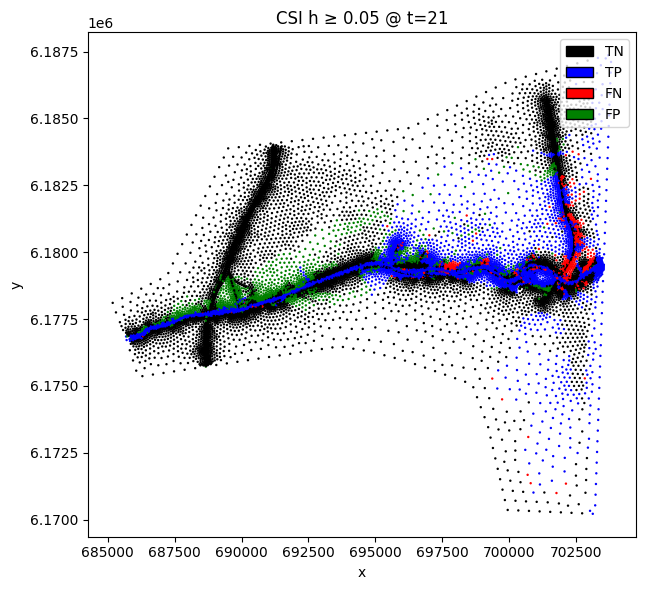

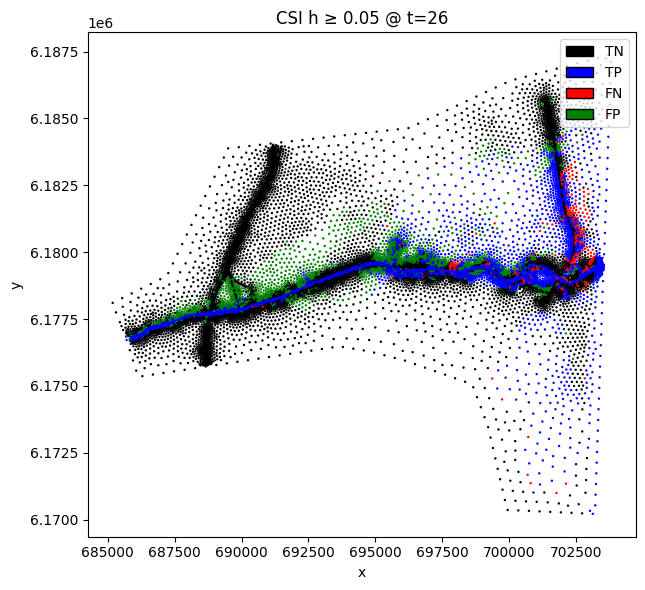

Group_2_peak_1600_Group_2_peak_1600_0_0-80_interpolated.pkl : CSI(h) moyen = 0.721


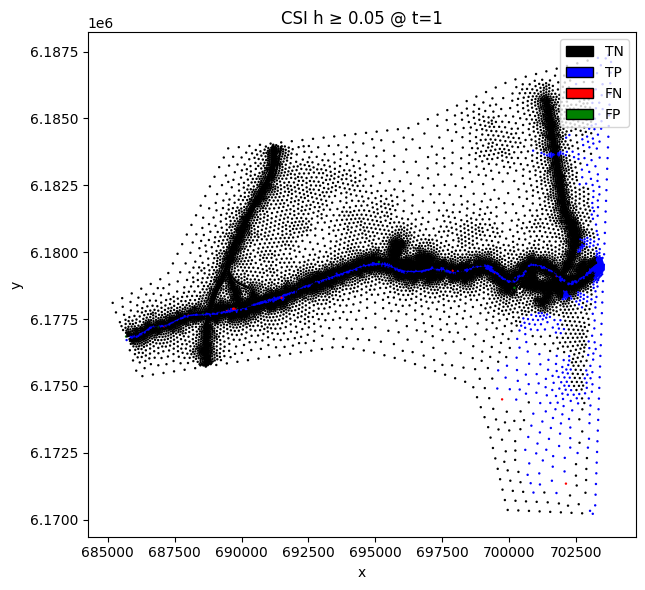

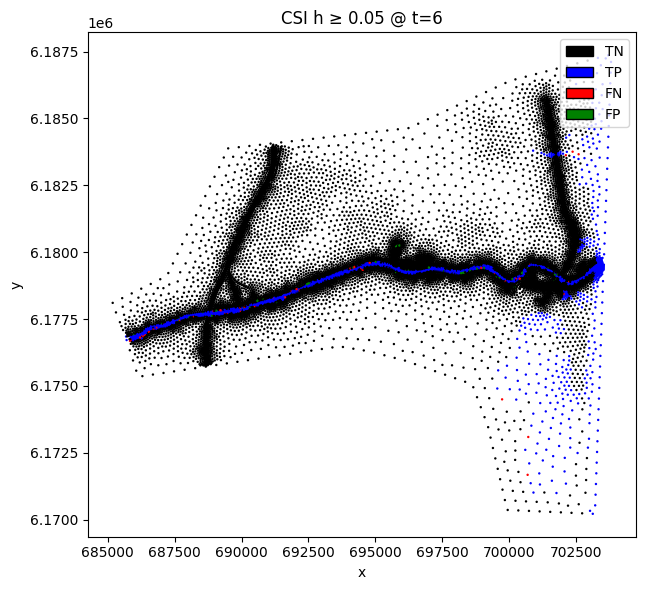

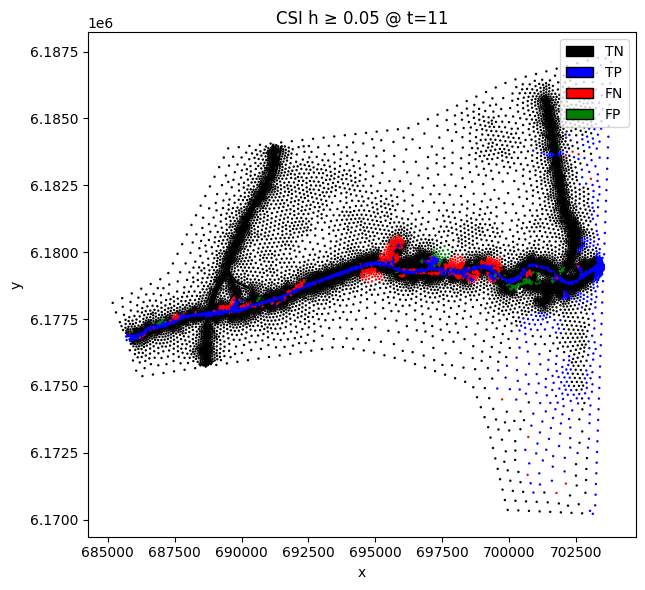

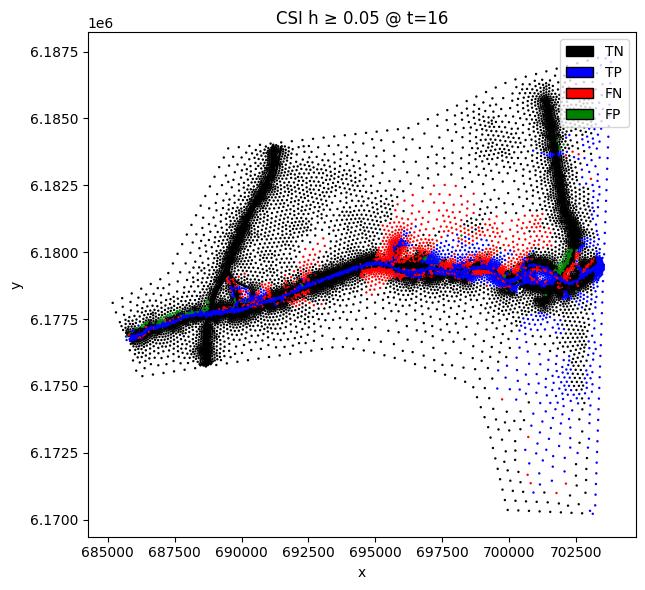

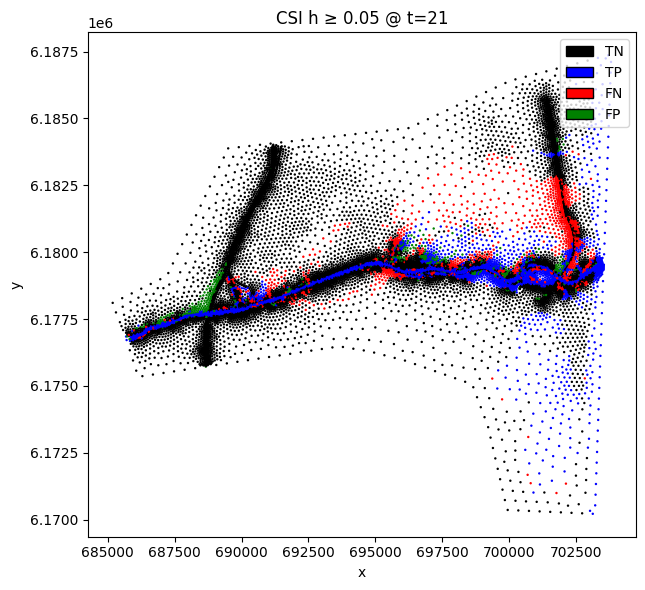

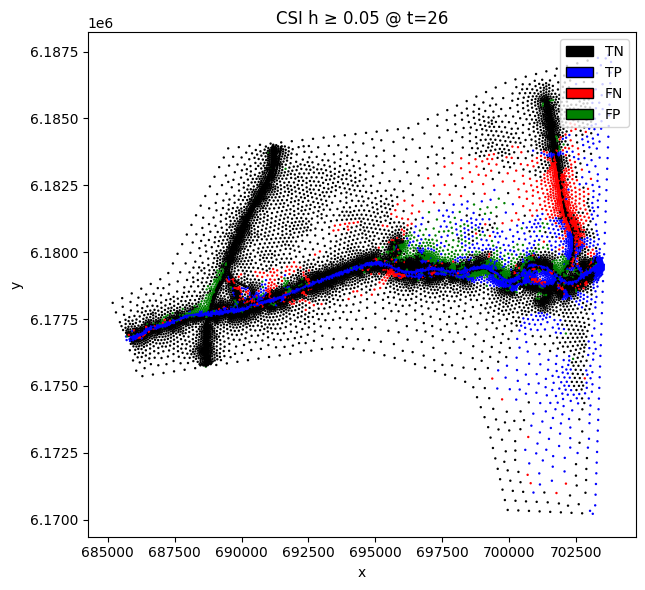

Group_4_peak_2000_Group_4_peak_2000_0_0-80_interpolated.pkl : CSI(h) moyen = 0.687


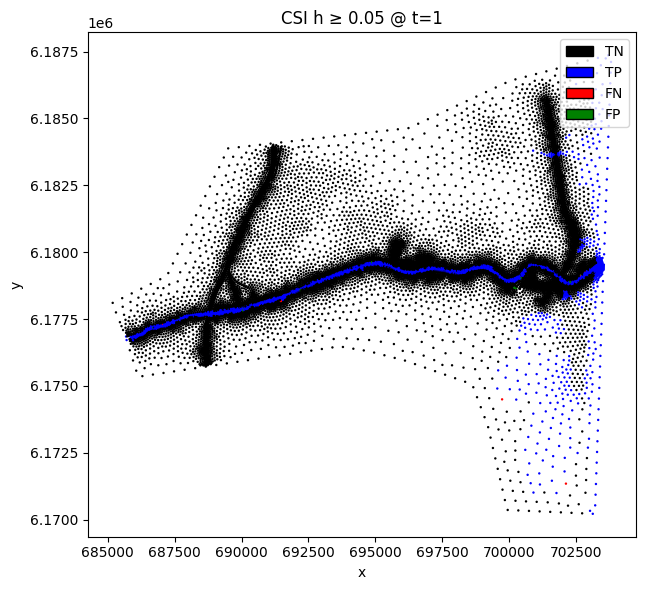

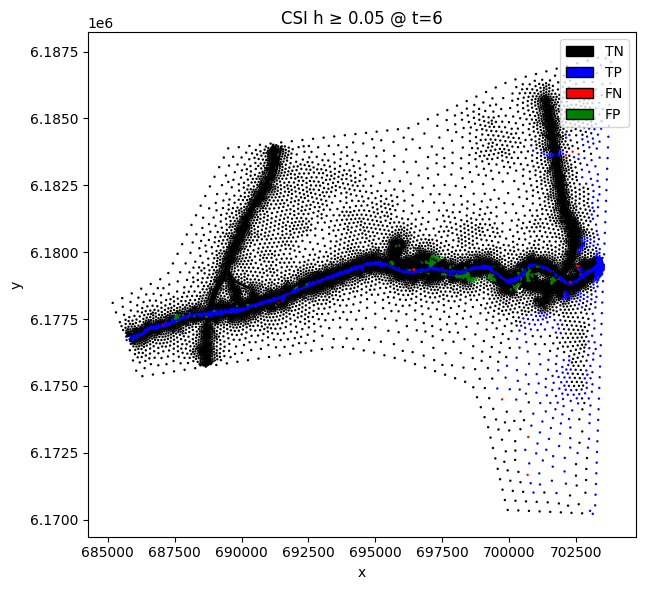

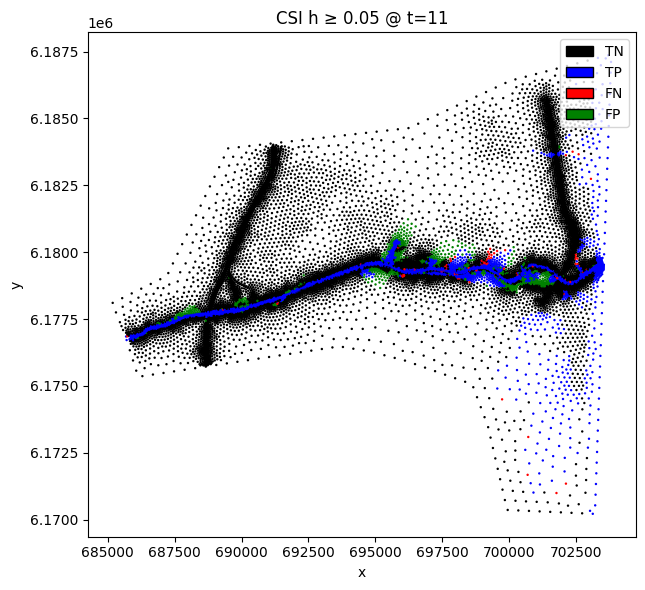

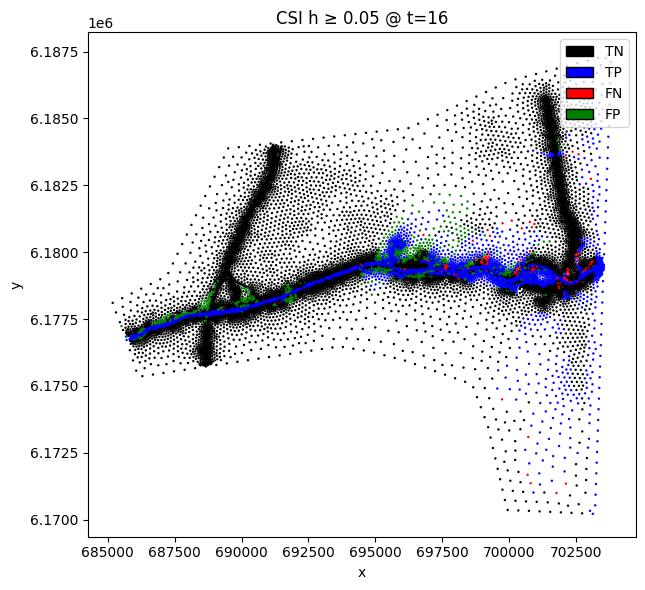

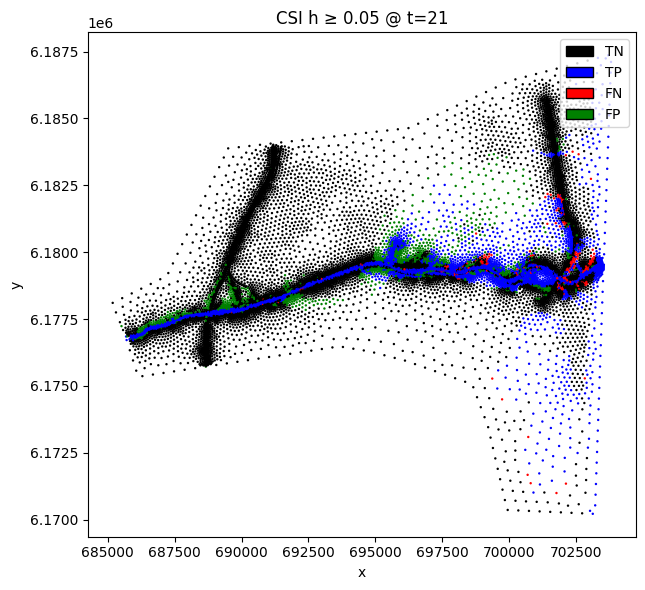

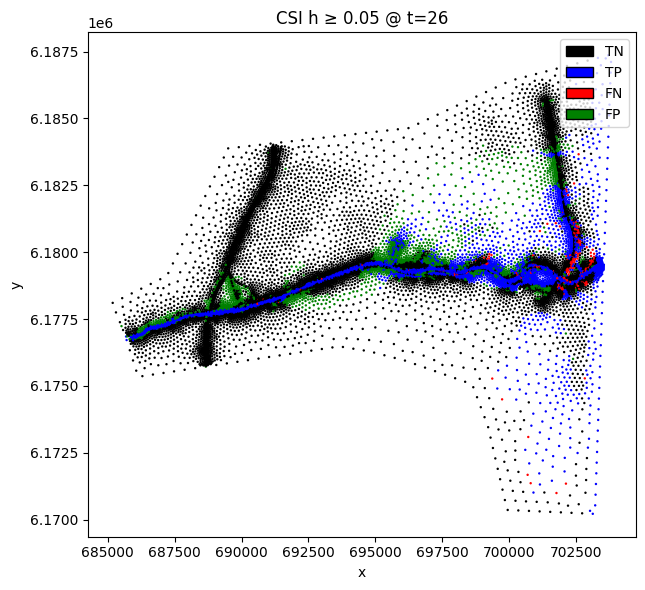

Group_1_peak_1200_Group_1_peak_1200_0_0-80_interpolated.pkl : CSI(h) moyen = 0.724


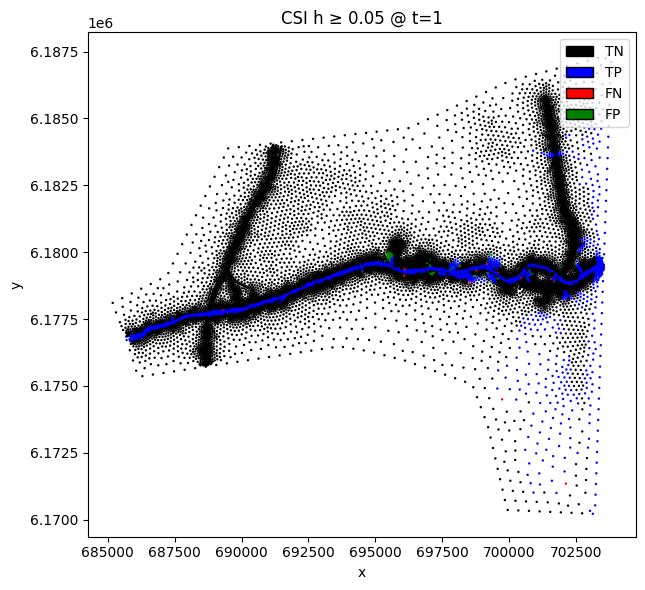

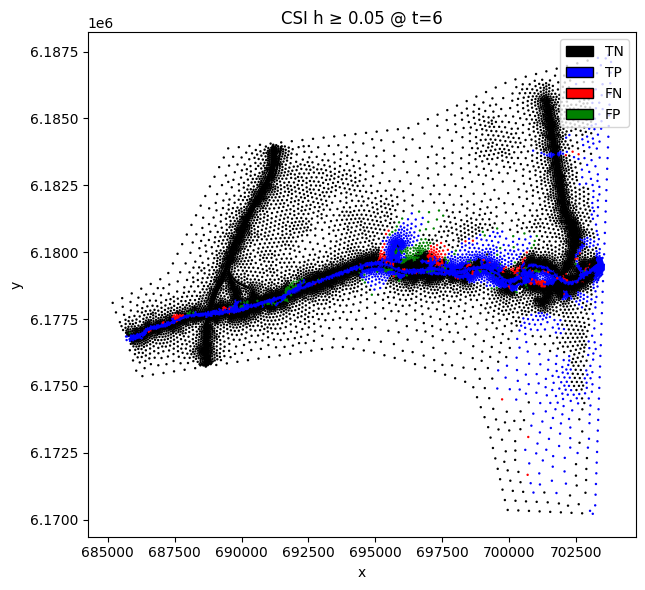

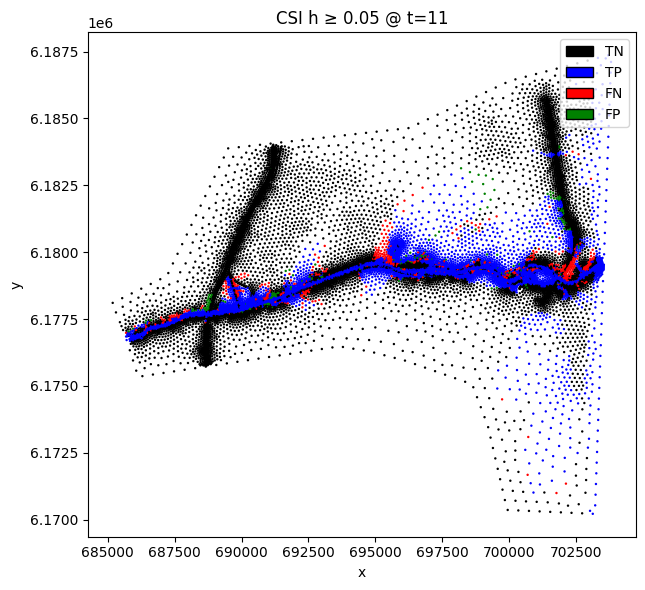

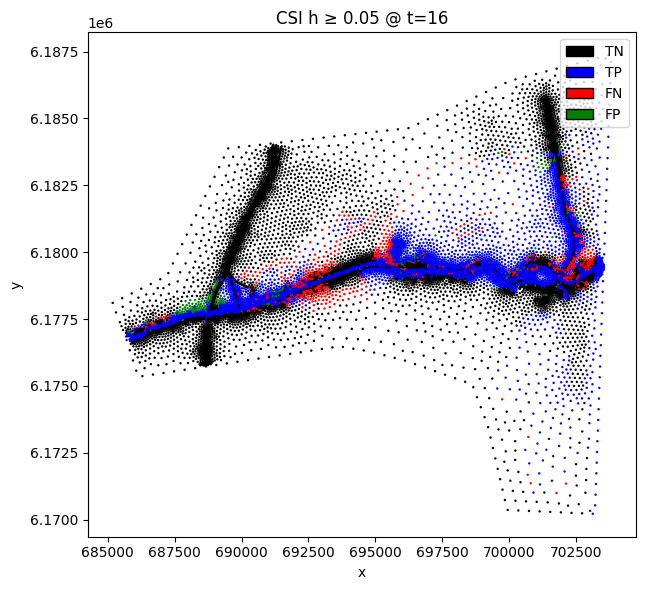

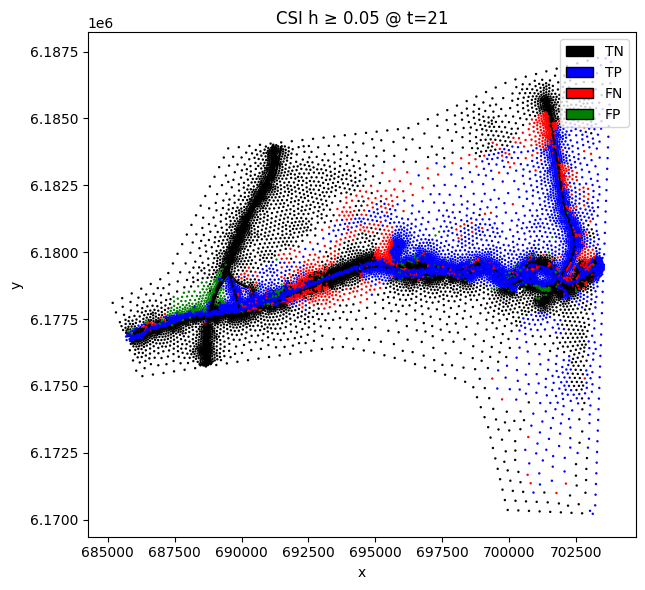

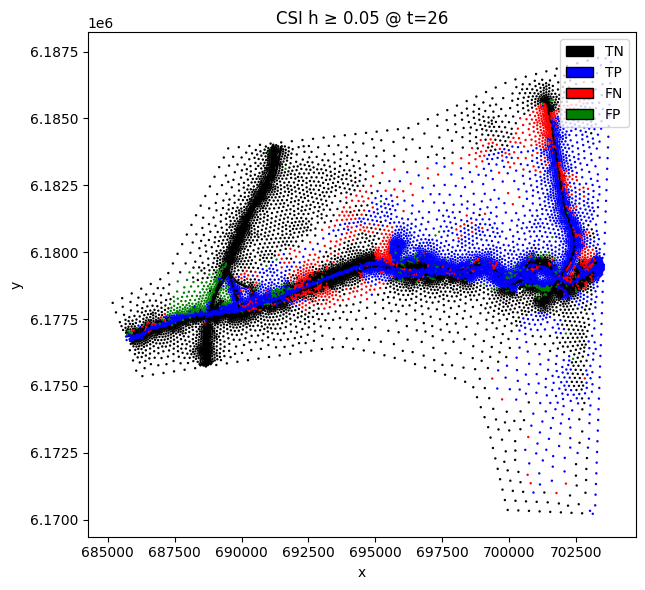

Group_1_peak_2400_Group_1_peak_2400_0_0-80_interpolated.pkl : CSI(h) moyen = 0.792


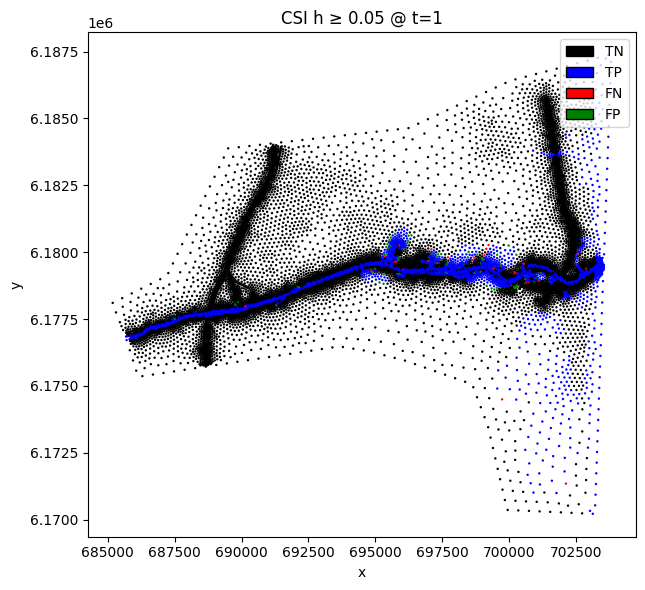

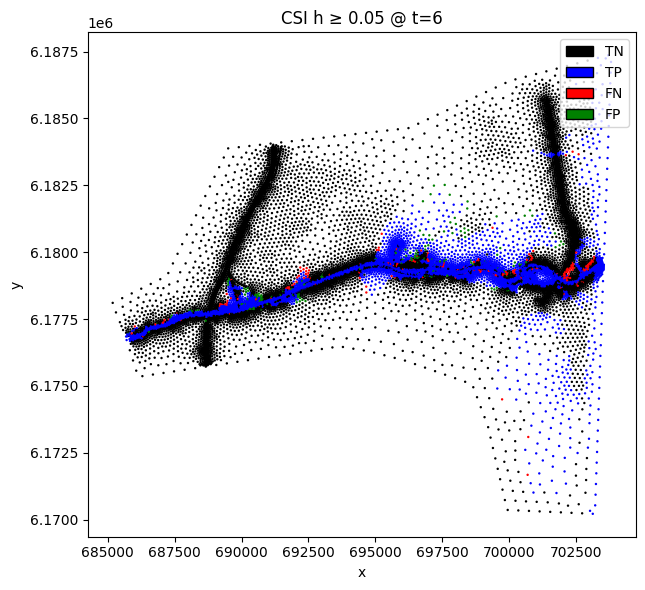

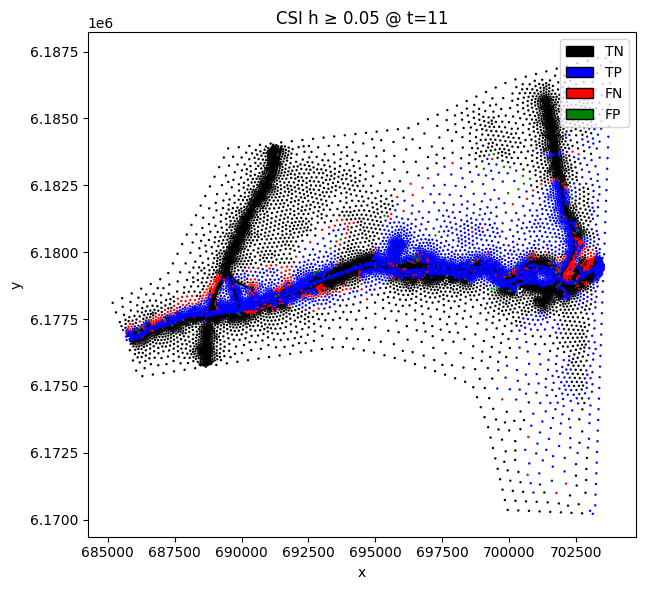

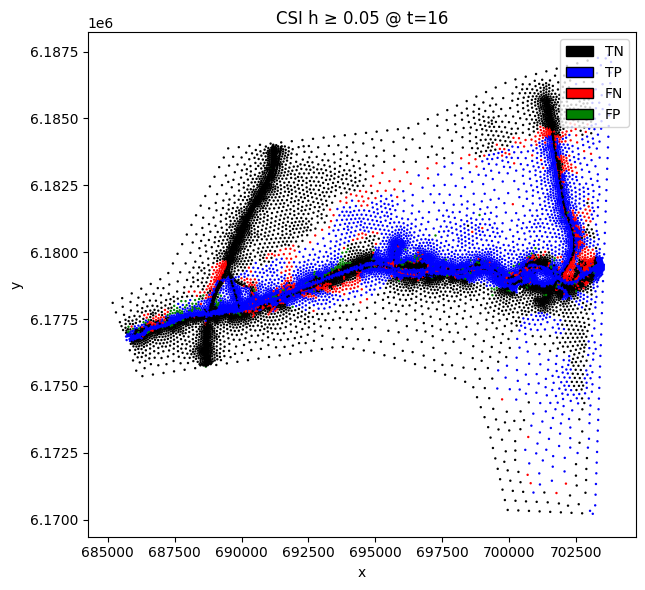

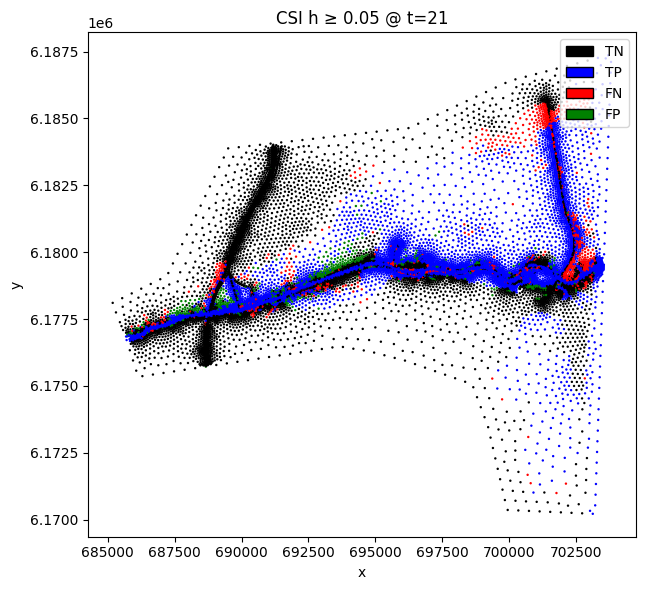

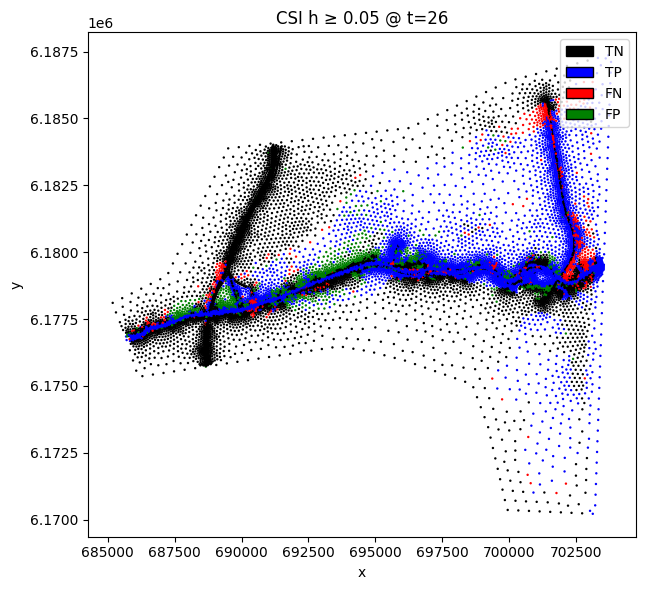

Group_3_peak_3400_Group_3_peak_3400_0_0-80_interpolated.pkl : CSI(h) moyen = 0.809


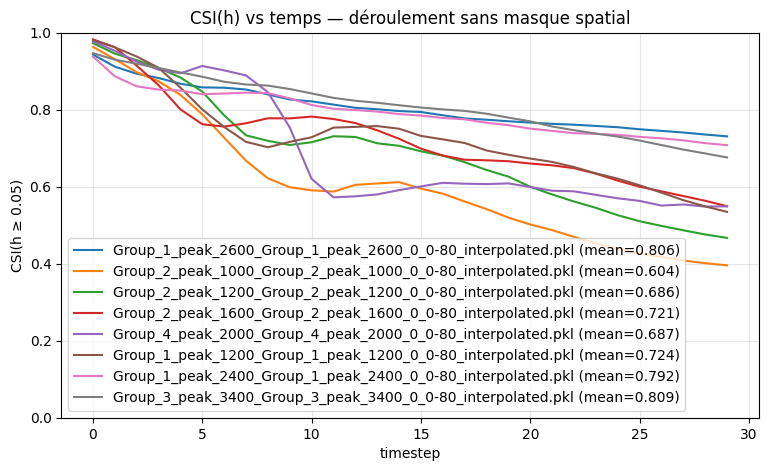

In [1]:
import os, sys, pickle, torch, numpy as np, dgl
import matplotlib.pyplot as plt

# ========= Imports de ton repo =========
project_path = os.path.abspath(os.path.join(os.getcwd(), '..', ''))
if project_path not in sys.path: sys.path.append(project_path)

from hydra.utils import to_absolute_path
from python.create_dgl_dataset import TelemacDataset
from python.CustomMeshGraphNet import MeshGraphNet
from modulus.launch.utils import load_checkpoint

# ===== (OPTIONNEL) pour positions de nœuds, nécessaire pour les plots CSI par nœud =====
MESH_SLF = "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Mesh8_corrige.slf"  # <-- adapte si besoin
try:
    from python.python_code.data_manip.extraction.telemac_file import TelemacFile
    from python.create_dgl_dataset import add_mesh_info
    _res_mesh = TelemacFile(MESH_SLF)
    POS, _ = add_mesh_info(_res_mesh)  # (N,2) numpy
    HAVE_POS = True
except Exception as e:
    print(f"[CSI-plot] Pas de positions (MESH_SLF='{MESH_SLF}'). Plots CSI par nœud désactivés. Raison: {e}")
    POS, HAVE_POS = None, False

# ===== config =====
DATA_BASE = "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Mesh8_base.bin"
PCKLS     = [ 
    "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Group_1_peak_2600_Group_1_peak_2600_0_0-80_interpolated.pkl",
    "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Group_2_peak_1000_Group_2_peak_1000_0_0-80_interpolated.pkl",
    "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Group_2_peak_1200_Group_2_peak_1200_0_0-80_interpolated.pkl",
    "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Group_2_peak_1600_Group_2_peak_1600_0_0-80_interpolated.pkl",
    "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Group_4_peak_2000_Group_4_peak_2000_0_0-80_interpolated.pkl",
    "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Group_1_peak_1200_Group_1_peak_1200_0_0-80_interpolated.pkl",
    "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Group_1_peak_2400_Group_1_peak_2400_0_0-80_interpolated.pkl",
    "/work/m24046/m24046mrcr/results_data_30min_35_70_maillagex8/Group_3_peak_3400_Group_3_peak_3400_0_0-80_interpolated.pkl",
]
CKPT_DIR  = "/work/m24046/m24046mrcr/testAter/Configx8ShortPushFront"
CKPT_EPOCH= 900

# Paramètres modèle (en ligne avec ta conf)
NUM_IN  = 9         # 6 statiques (4 one-hot + strickler + z) + 3 dyn (h,u,v)
NUM_E   = 3
NUM_OUT = 3
MP_LAYERS = 10
DO_CONCAT = True
SEGMENTS  = 0

# Indices des features dynamiques dans ndata['x']
DYN_START = 6   # [onehot(4), strickler(1), z(1)] -> 6 colonnes statiques
DYN_LEN   = 3   # (h,u,v)

# Seuil pour CSI
EPS = 0.05

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ===== helpers =====
def denorm(xn, mean, std):
    return xn * std + mean

def renorm(x, mean, std):
    return (x - mean) / (std + 1e-12)

def csi_binary(pred_h, gt_h, thr=0.05):
    # CSI = TP / (TP+FP+FN) sur binaire(h >= thr)
    valid = ~np.isnan(pred_h) & ~np.isnan(gt_h)
    if not np.any(valid): 
        return np.nan
    p = pred_h[valid] >= thr
    g =  gt_h[valid] >= thr
    TP = np.sum(p & g)
    FP = np.sum(p & ~g)
    FN = np.sum(~p & g)
    den = TP + FP + FN
    return (TP / den) if den > 0 else np.nan

# ====== Prépare dataset (pour récupérer base_graph + stats) ======
ds = TelemacDataset(
    name="telemac_test",
    data_dir=to_absolute_path(DATA_BASE),
    dynamic_data_files=[to_absolute_path(p) for p in PCKLS],  # peu importe ici
    split="test",
    ckpt_path=CKPT_DIR,
    normalize=True,           # important: on charge les stats depuis CKPT_DIR
    sequence_length=1,
    overlap=0,
)

base_graph = ds.base_graph.to(device)
node_stats = ds.node_stats

# ==== récupère static + stats depuis ton dataset ====
g_base = base_graph.to(device)
static_feat = g_base.ndata['static']              # (N,6)
DYN_START   = static_feat.shape[1]                # = 6 (sécurisé)
DYN_LEN     = 3

# Stats pour (h,u,v) et (delta_h,delta_u,delta_v)
mx = np.array([node_stats['h'].item(),        node_stats['u'].item(),        node_stats['v'].item()],        dtype=np.float32)
sx = np.array([node_stats['h_std'].item(),    node_stats['u_std'].item(),    node_stats['v_std'].item()],    dtype=np.float32)
my = np.array([node_stats['delta_h'].item(),  node_stats['delta_u'].item(),  node_stats['delta_v'].item()],  dtype=np.float32)
sy = np.array([node_stats['delta_h_std'].item(), node_stats['delta_u_std'].item(), node_stats['delta_v_std'].item()], dtype=np.float32)

# ====== Modèle + checkpoint ======
model = MeshGraphNet(
    NUM_IN, NUM_E, NUM_OUT,
    processor_size=MP_LAYERS,
    hidden_dim_processor=64,
    hidden_dim_node_encoder=64,
    hidden_dim_edge_encoder=64,
    hidden_dim_node_decoder=64,
    do_concat_trick=DO_CONCAT,
    num_processor_checkpoint_segments=SEGMENTS,
).to(device)
model.eval()

_ = load_checkpoint(
    to_absolute_path(CKPT_DIR),
    models=model,
    device=device,
    epoch=CKPT_EPOCH,
)

# ==== Utilitaires de plot CSI par nœud ====
from matplotlib.colors import ListedColormap, BoundaryNorm
CSI_CMAP  = ListedColormap(['black', 'blue', 'red', 'green'])  # TN, TP, FN, FP
CSI_BOUNDS= [0, 1, 2, 3, 4]
CSI_NORM  = BoundaryNorm(CSI_BOUNDS, CSI_CMAP.N)

def classify_csi_labels(h_pred, h_gt, thr=0.05):
    """Retourne labels {0:TN,1:TP,2:FN,3:FP} pour chaque nœud."""
    valid = ~np.isnan(h_pred) & ~np.isnan(h_gt)
    lab = np.zeros_like(h_pred, dtype=np.int32)  # TN par défaut
    p = h_pred >= thr
    g = h_gt   >= thr
    lab[ valid &  p &  g] = 1  # TP
    lab[ valid & ~p &  g] = 2  # FN
    lab[ valid &  p & ~g] = 3  # FP
    return lab

def plot_csi_nodes(pos, labels, step, eps=0.05, fname=None, title_prefix="CSI h"):
    x, y = pos[:,0], pos[:,1]
    fig, ax = plt.subplots(figsize=(7,6))
    sc = ax.scatter(x, y, c=labels, cmap=CSI_CMAP, norm=CSI_NORM, s=3, linewidths=0)
    ax.set_aspect('equal')
    ax.set_title(f"{title_prefix} ≥ {eps:.2f} @ t={step}")
    ax.set_xlabel("x"); ax.set_ylabel("y")
    # légende custom
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='black', edgecolor='k', label='TN'),
        Patch(facecolor='blue',  edgecolor='k', label='TP'),
        Patch(facecolor='red',   edgecolor='k', label='FN'),
        Patch(facecolor='green', edgecolor='k', label='FP'),
    ]
    ax.legend(handles=legend_elements, loc='upper right')
    plt.tight_layout()
    if fname:
        os.makedirs(os.path.dirname(fname), exist_ok=True)
        plt.savefig(fname, dpi=150)
        plt.close(fig)
    else:
        plt.show()

# ==== Déroulement + CSI + PLOTS tous les 3 pas ====
def rollout_csi_one_file(pkl_path, model, eps=EPS, apply_bc=True, plot_every=3, out_dir="./plots_csi"):
    with open(pkl_path, 'rb') as f:
        dynamic_data = pickle.load(f)     # liste de (x_dyn, y) par pas
    T = len(dynamic_data); assert T >= 2

    # graph de travail + x(t=0)
    g = g_base.clone().to(device)
    x_dyn0 = dynamic_data[0][0].astype(np.float32)          # (N,3) h,u,v @ t=0 (non norm.)
    xn0    = renorm(x_dyn0, mx, sx)                         # normalisé
    g.ndata['x'] = torch.cat([static_feat, torch.from_numpy(xn0).to(device)], dim=1)

    # masques CL (depuis one-hot dans les 4 premières colonnes)
    onehot = g.ndata['x'][:, :4]
    q_mask = (onehot == torch.tensor([0,0,1,0], device=device)).all(dim=1)   # Prescribed Q
    h_mask = (onehot == torch.tensor([0,1,0,0], device=device)).all(dim=1)   # Prescribed H
    q_mask_np, h_mask_np = q_mask.detach().cpu().numpy(), h_mask.detach().cpu().numpy()

    # dossier plots (par crue)
    base_name = os.path.splitext(os.path.basename(pkl_path))[0]
    if out_dir is not None:
        out_dir = os.path.join(out_dir, base_name)
        os.makedirs(out_dir, exist_ok=True)

    csi_curve = []
    for t in range(T-1):
        with torch.no_grad():
            y_pred_n = model(g.ndata['x'], g.edata['x'], g)                 # (N,3) deltas norm.
        y_pred   = denorm(y_pred_n.detach().cpu().numpy(), my, sy)          # (N,3) deltas

        xn_t = g.ndata['x'][:, DYN_START:DYN_START+DYN_LEN].detach().cpu().numpy()
        x_t  = denorm(xn_t, mx, sx)                                         # (N,3) h,u,v @ t
        x_t1_pred = x_t + y_pred                                            # prédiction @ t+1

        x_t1_gt = dynamic_data[t+1][0].astype(np.float32)                   # GT @ t+1 (N,3)

        if apply_bc:
            x_t1_pred[q_mask_np, :]   = x_t1_gt[q_mask_np, :]
            x_t1_pred[h_mask_np, 0:1] = x_t1_gt[h_mask_np, 0:1]

        # CSI(h) global à ce pas
        csi_curve.append(csi_binary(x_t1_pred[:,0], x_t1_gt[:,0], thr=eps))

        # === PLOT tous les 3 pas ===
        if HAVE_POS and (t % plot_every == 0):
            labels = classify_csi_labels(x_t1_pred[:,0], x_t1_gt[:,0], thr=eps)
            fname = os.path.join(out_dir, f"csi_nodes_t{t+1:03d}.png") if out_dir else None
            plot_csi_nodes(POS, labels, step=t+1, eps=eps, fname=fname, title_prefix="CSI h")

        # réinjection normalisée pour le pas suivant
        xn_t1_pred = renorm(x_t1_pred, mx, sx)
        g.ndata['x'] = torch.cat([g.ndata['x'][:, :DYN_START], torch.from_numpy(xn_t1_pred).to(device)], dim=1)

    return np.array(csi_curve, dtype=np.float32)

# ==== exécution et plot global ====
curves = []
for p in PCKLS:
    csi = rollout_csi_one_file(p, model, eps=EPS, apply_bc=True, plot_every=5, out_dir=None)
    curves.append((os.path.basename(p), csi))
    print(f"{os.path.basename(p)} : CSI(h) moyen = {np.nanmean(csi):.3f}")

plt.figure(figsize=(9,5))
for name, csi in curves:
    plt.plot(csi, label=f"{name} (mean={np.nanmean(csi):.3f})")
plt.ylim(0,1); plt.grid(True, alpha=0.3)
plt.xlabel("timestep"); plt.ylabel(f"CSI(h ≥ {EPS:.2f})")
plt.title("CSI(h) vs temps — déroulement sans masque spatial")
plt.legend(); plt.show()

In [2]:
push_front_mean_2 = np.mean([curve[1]for curve in curves],axis=0)

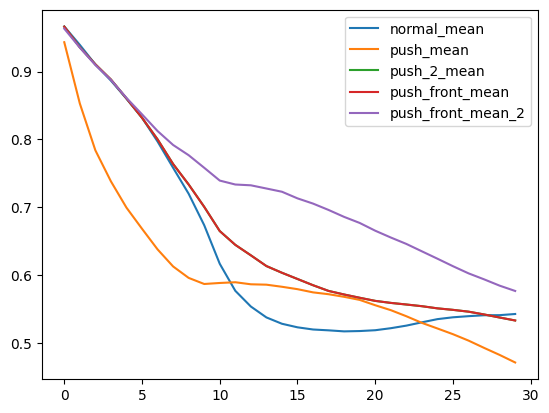

In [3]:
normal_mean = np.load('./temp/normal_mean.npy')
push_mean = np.load('./temp/push_mean.npy')
push_2_mean = np.load('./temp/push_2_mean.npy')
push_front_mean = np.load('./temp/push_front_mean.npy')

plt.plot(normal_mean,label='normal_mean')
plt.plot(push_mean,label='push_mean')
plt.plot(push_2_mean,label='push_2_mean')
plt.plot(push_front_mean,label='push_front_mean')
plt.plot(push_front_mean_2,label='push_front_mean_2')
plt.legend()
plt.show()